# 🎲 Ludo tracker

## 🗑️ Description 
You should implement a system that recognizes the state of gameplay from the movie (in the selected board game). The program should track the movement of counters, dice, cards and detect events on the film.
The task is also to find the appropriate input data (or your own video recording).

The input data should be divided into 3 groups depending on the difficulty for example:
easy: perfect view, the game elements are not covered with your hands when carrying it...
medium: different dynamics of light in the picture, shadows, light reflections...
difficult: angled view, game components partially covered with hands when moving, slight shaking of the camera...
Each data group should have at least 3 representative clips (max 5 min per clip).

The selected game may be a real board game or some extension of it. It cannot be a computer game, although computer simulations can be used to test solutions or to train ML models.

Typical card games such as poker, macau, bridge … that contain only cards are insufficient and must be extended with some additional elements that should be consulted.
Don’t use NN.


### Requirements
3.0:
* preparation of a data set,
* preparation and presentation of the results (e.g. a game video with information about true events - described below)
* detection of at least 2 elements of the game: counter, dice, card, figure….
tracking some element of game: counters, dices, cards in the movie
* a report containing:
    * Informations from milestone 1,
    * description of the data set, with a few image examples,
    * description of the used techniques along with the intermediate results  for each processing step of the example frame,
    * the effectiveness for each dataset,
    * analysis and conclusions of the obtained results,
    * potential references to literature.

4.0:
* requirements for 3.0 and:
* detection of at least 2 selected events in the movie, e.g.
    * roll the dice and read the result
    * play a card
    * moving a counter(from a given position to a new position)
    * placing a counter

5.0:
* requirements for 4.0 and:
* Game status detection
* detection of at least 5 selected events
* Track gameplay score


## Game description

* team members: Zuzanna Gawrysiak 148255, Agata Żywot 148258
* selected game: Ludo (Chińczyk)
* description: a strategy board game for two to four players, in which the players race their four tokens from start to finish according to the rolls of a single die.
* in-game items:
    * 16 tokens (4 of each colour)
    * 1 dice
    * 1 board
* events:
    * rolling dice (number of dots)
    * moving a token (changing field)
    * winning (four tokens in base)
    * capturing (two tokens of different colours on the same field)
    * enter a token into play from its yard to its starting square (preceded by rolling 6)

## Preparation

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, clear_output
import ipywidgets as widgets
import PIL
from PIL import Image
from random import randint
import copy
import sys
if '../' not in sys.path:
    sys.path.append('../')
from random import randrange
from src.dice import get_dice_number, get_rolling_area
from src.patterns import *
from src.utils import *
from src.detection import *

%matplotlib inline

In [2]:
### USE THIS FUNCTION WHILE PROVIDING SOME NEW FEATURES - this one does not crash, some do :(
def play_video(video_path):
    cap = cv2.VideoCapture(video_path)
    # cap.set(3,640) # adjust width
    # cap.set(4,480) # adjust height

    while True:
        success, img = cap.read()
        if not success:
            cap.release()
            break

        ### ALL NECESSARY FUNCTIONS WILL BE HERE ###

        ####################################
        cv2.imshow(video_path, img)
        if cv2.waitKey(1) & 0xFF==ord('q'): # quit when 'q' is pressed
            cap.release()
            break
            
    cv2.destroyAllWindows()

## Dataset
Sample images for each difficulty level.

easy / medium / difficult


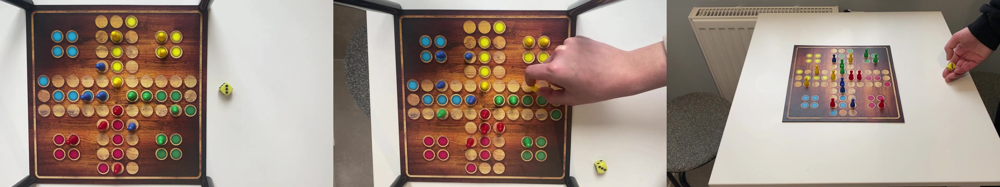

In [3]:
easy = cv2.imread('data/dataset_2/samples/sample_easy.jpg', 1)
medium = cv2.imread('data/dataset_2/samples/sample_medium.jpg', 1)
difficult = cv2.imread('data/dataset_2/samples/sample_difficult.jpg', 1)

print("easy / medium / difficult")
imshow(np.concatenate([easy, medium, difficult], 1))

## Recognizing objects
1. Map board: coordinates of every element

    - dice (done) **ZUZA DONE**
    - starting area (pattern) **ZUZA DONE**
    - yards (pattern) **ZUZA DONE**
    - playing area (each box) **AGATA DONE**
    - bases (color box -> get colors) **AGATA**
    - counter detection (circles in specified color) - **AGATA**


In [4]:
TEMPLATES_PATH_DIR = './data/dataset_2/templates'
COLORS = [(0,0,255), (255,0,0), (0,255,0), (255,0,255)]

### Ludo board

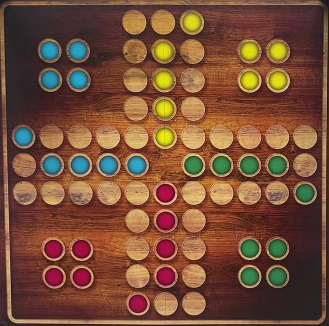

In [5]:
BOARD_IMG_PATH = 'data/dataset_2/board_easy.jpg'
img = cv2.imread(BOARD_IMG_PATH, 1)
img_rect, board_img, board_coords = detect_board(img)
imshow(cv2.resize(board_img, None, fx=0.5, fy=0.5))

### Start field, yards and bases
Detected using template matching opencv method.

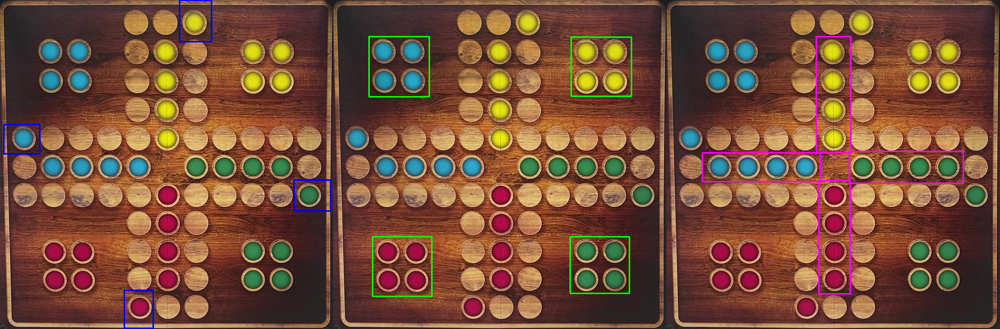

In [6]:
start_templates = ["start_blue", "start_green", "start_red", "start_yellow"]
start_templates_files = [f'{TEMPLATES_PATH_DIR}/{t}.jpg' for t in start_templates]
starts, start_coords = match_patterns(board_img, start_templates_files, color=COLORS[1])
start_objects = create_game_objects(start_coords, board_img)

yard_templates = ["yard_blue", "yard_green", "yard_red", "yard_yellow"]
yard_templates_files = [f'{TEMPLATES_PATH_DIR}/{t}.jpg' for t in yard_templates]
yards, yards_coords = match_patterns(board_img, yard_templates_files, color=COLORS[2])
yards_objects = create_game_objects(yards_coords, board_img)

base_templates = ["base_blue", "base_green", "base_red", "base_yellow"]
base_templates_files = [f'{TEMPLATES_PATH_DIR}/{t}.jpg' for t in base_templates]
bases, bases_coords = match_patterns(board_img, base_templates_files, color=COLORS[3])
bases_objects = create_game_objects(bases_coords, board_img)

imshow(np.concatenate([starts, yards, bases], 1))
# EXAMPLE
# start_objects['red'][0].show(board_img)
# print(start_objects['red'][0].color)

yards_objects_mapped = map_coords(yards_objects, board_coords)
bases_objects_mapped = map_coords(bases_objects, board_coords)

### Playing area
Steps:
- image noise reduction
- edge detection
- morphological operations
- contour detection
- check whether rectangles are of square-like shape 

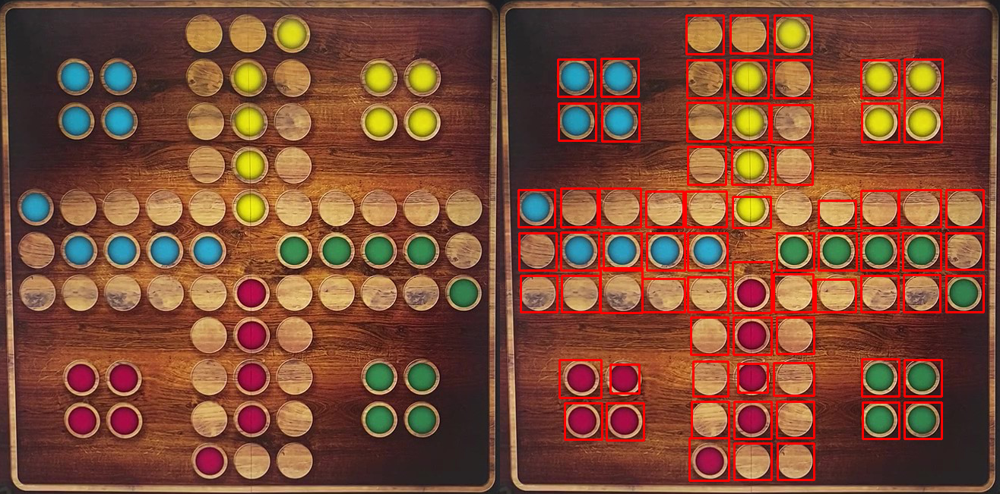

In [7]:
playing_area, fields_coords = get_playing_fields(board_img, rect_size=(30,100))
imshow(np.concatenate([board_img, playing_area], 1))

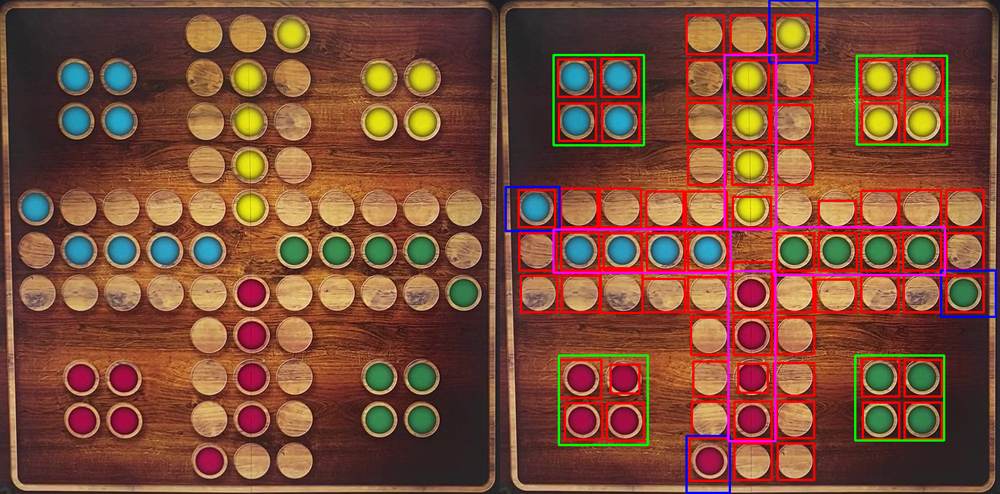

In [8]:
board_with_objects = board_img.copy() 
coords = [fields_coords, start_coords, yards_coords, bases_coords]
for coord_type, color in zip(coords, COLORS):
    for c in coord_type:
        cv2.rectangle(board_with_objects, c[0], c[1], color, 2)
imshow(np.concatenate([board_img, board_with_objects],1))

In [9]:
def play_video_board(video_path, coords):
    cap = cv2.VideoCapture(video_path)

    while True:
        success, img = cap.read()
        if not success:
            cap.release()
            break

        ### ALL NECESSARY FUNCTIONS HERE ###
        img, img_cropped, img_coords = detect_board(img)

        for coord_type, color in zip(coords, COLORS):
            for c in coord_type:
                cv2.rectangle(img_cropped, c[0], c[1], color, 2)
        ####################################
        cv2.imshow(video_path, img_cropped)
        if cv2.waitKey(1) & 0xFF==ord('q'): # quit when 'q' is pressed
            cap.release()
            break
            
    cv2.destroyAllWindows()

In [ ]:
# detect board elements on video
play_video_board('data/dataset_2/recordings/easy/play_1.mp4', coords)

### Counter detection

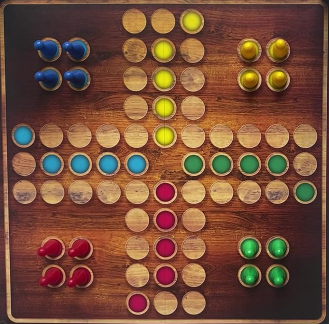

In [10]:
img_counters = cv2.imread('data/dataset_2/all_yard_easy.jpg', 1)
img_counters_board, img_counters_cropped, img_counters_coords = detect_board(img_counters)
imshow(cv2.resize(img_counters_cropped, None, fx=0.5, fy=0.5))

#### Create masks take the differences

In [11]:
mask_img_list = create_masks(board_img, fields_coords)
# SHOW MASKS
# for m in mask_img_list[:3]:
#     imshow(cv2.resize(m, None, fx=0.5, fy=0.5))

In [12]:
WIDTH = board_img.shape[0]
HEIGHT = board_img.shape[1]
resized_img = cv2.resize(img_counters_cropped, (HEIGHT, WIDTH), interpolation=cv2.INTER_LINEAR)
assert board_img.shape == resized_img.shape
# imshow(cv2.resize(np.concatenate([board_img, resized_img], 1), None, fx=0.5, fy=0.5))

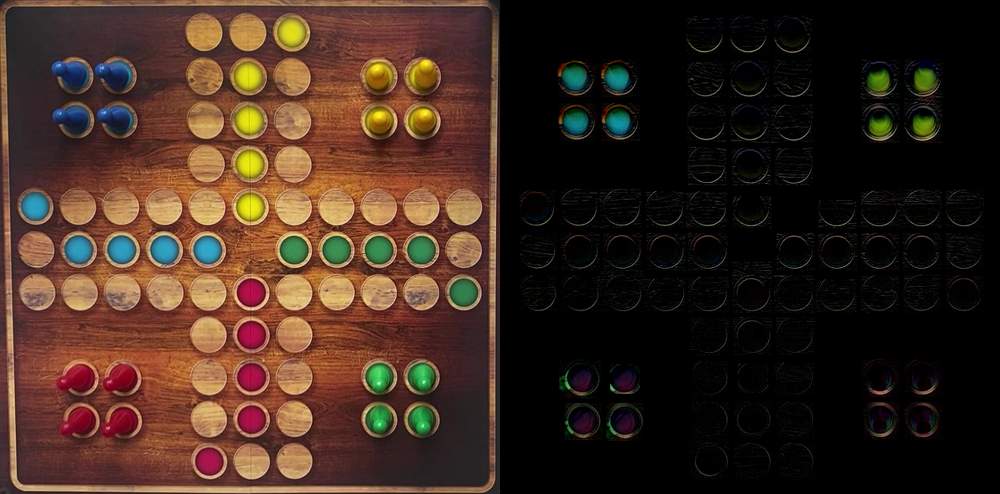

In [13]:
counters_img = take_masks_difference(resized_img, mask_img_list)
imshow(np.concatenate([resized_img, counters_img], 1)) 

#### Find counters and check their color

In [58]:
coords_ranked = get_counters_coords(counters_img, fields_coords)
top16 = [tuple[0] for tuple in coords_ranked[:16]]
counter_objects = create_game_objects(top16, resized_img)

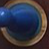

blue


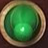

green


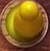

yellow


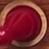

red


In [60]:
# SHOW RESULTS
for k in counter_objects.keys():
    counter_objects[k][0].show(resized_img)
    print(counter_objects[k][0].color)

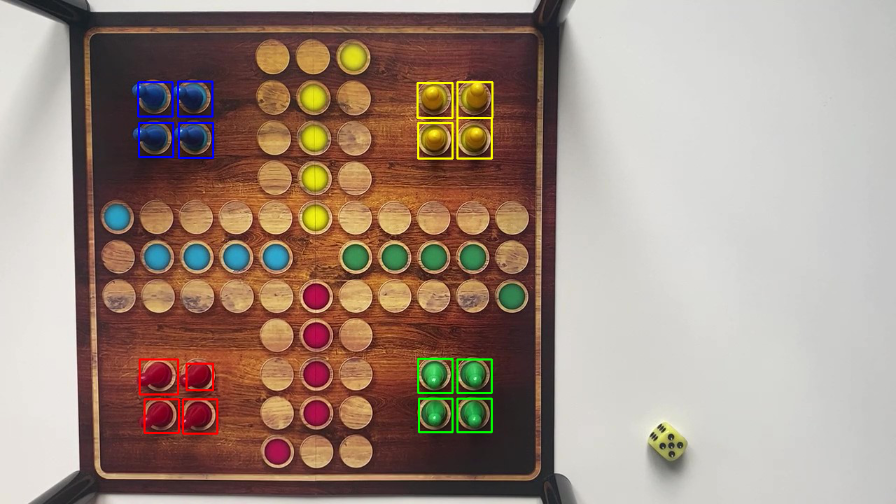

In [16]:
img = cv2.imread('data/dataset_2/all_yard_easy.jpg', 1)
counters = detect_counters(img, board_img)
COLOR_VALUES = {'red': (0,0,255), 'green':(0,255,0), 'blue':(255,0,0), 'yellow':(0,255,255)}

for c in counters:
    cv2.rectangle(img, (c.x, c.y), (c.x+c.w, c.y+c.h), COLOR_VALUES[c.color], 2)
    # print(c.x, c.y, c.color)
imshow(cv2.resize(img, None, fx=0.7, fy=0.7))

## Tracking

### Counter tracking

In [21]:
cap = cv2.VideoCapture('data/dataset_2/recordings/easy/play_3.mp4')

success, frame = cap.read()
if not success:
  print('Failed to read video')
  sys.exit(1)

In [22]:
counters = detect_counters(frame, board_img)
bboxes = []
colors = [(0, 0, 255), (255, 0, 0), (0, 255, 0), (255, 0, 255)]
counter_colors = []
for c in counters:
    bboxes.append((c.x, c.y, c.w, c.h))
    counter_colors.append(c.color)


multiTracker = cv2.legacy.MultiTracker.create()

for bbox in bboxes:
    multiTracker.add(cv2.legacy.TrackerCSRT_create(), frame, bbox)

In [23]:
# Process video and track objects
while cap.isOpened():
    success, frame = cap.read()
    if not success:
        break

    # get updated location of objects in subsequent frames
    success, boxes = multiTracker.update(frame)

    # draw tracked objects
    for i, newbox in enumerate(boxes):
        p1 = (int(newbox[0]), int(newbox[1]))
        p2 = (int(newbox[0] + newbox[2]), int(newbox[1] + newbox[3]))
        cv2.rectangle(frame, p1, p2, colors[i%4], 2, 1)

    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    # show frame
    plt.axis('off')
    plt.imshow(frame)
    plt.show()
    clear_output(wait=True)

    # quit on esc button
    if cv2.waitKey(1) & 0xFF == 27:  # esc pressed
        break

KeyboardInterrupt: 

## Actions

### Dice rolling
Reading the result of dice is done by firstly restricting the area to big, white field. Then using blob detection and clustering (DBSCAN) we obtain the number of circles on dice.

In [24]:
cap = cv2.VideoCapture('data/dataset_2/recordings/easy/play_1.mp4')

success, frame = cap.read()
if not success:
  print('Failed to read video')
  sys.exit(1)

In [25]:
x = get_rolling_area(frame)

while cap.isOpened():
    success, frame = cap.read()
    if not success:
        break
    frame = get_dice_number(frame, x)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.axis('off')
    plt.imshow(frame)
    plt.show()
    clear_output(wait=True)

    if cv2.waitKey(1) & 0xFF == 27:
        break

KeyboardInterrupt: 

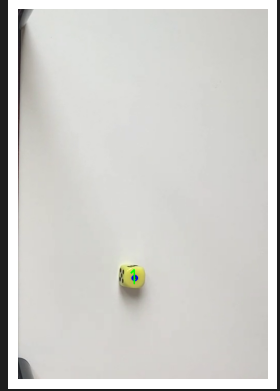

### Detect capturing
Capturing is detected when bounding boxes of two checkers of different colors intersect.

In [26]:
cap = cv2.VideoCapture('data/dataset_2/recordings/easy/play_3.mp4')

success, frame = cap.read()
if not success:
  print('Failed to read video')
  sys.exit(1)

In [27]:
bboxes = [(494, 60, 30, 30), (669, 186, 26, 26)]
box_colors = [(0, 0, 255), (255, 0, 0)]
checker_colors = ["blue", "yellow"]
multiTracker = cv2.legacy.MultiTracker.create()

for bbox in bboxes:
    multiTracker.add(cv2.legacy.TrackerCSRT_create(), frame, bbox)

In [28]:
new_boxes = bboxes.copy()

while cap.isOpened():
    success, frame = cap.read()
    if not success:
        break

    flags = [True for i in range(len(new_boxes))]    
    success, boxes = multiTracker.update(frame)
    for i in range(len(boxes)):
        if np.array_equal(boxes[i], np.asarray(new_boxes[i], dtype=np.float32)):
            flags[i] = False

    new_boxes = boxes.copy()

    for i in range(len(boxes) - 1):
        p1 = (int(boxes[i][0]), int(boxes[i][1]))
        p2 = (int(boxes[i][0] + boxes[i][2]), int(boxes[i][1] + boxes[i][3]))
        cv2.rectangle(frame, p1, p2, box_colors[i], 2, 1)

        if flags[i]:
            for j in range(i, len(boxes)):
                if checker_colors[i] != checker_colors[j]:
                    if check_intersection(boxes[i], boxes[j]):
                        cv2.putText(img=frame, text='CAPTURED', org=(850, 100), fontFace=cv2.FONT_HERSHEY_TRIPLEX, fontScale=2, color=(0, 255, 0), thickness=2)
    
    cv2.rectangle(frame, p1, p2, box_colors[i], 2, 1)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.axis('off')
    plt.imshow(frame)
    plt.show()
    clear_output(wait=True)

    if cv2.waitKey(1) & 0xFF == 27:
        break

KeyboardInterrupt: 

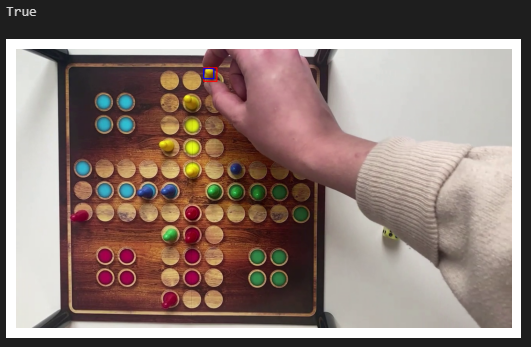

### Detect winning
Winning is detected when all checkers of one color are aligned horizontally or vertically.

In [29]:
cap = cv2.VideoCapture('data/dataset_2/recordings/easy/all_in_base.mp4')

success, frame = cap.read()
if not success:
  print('Failed to read video')
  sys.exit(1)

In [30]:
bboxes = [(435, 416, 30, 30), (438, 463, 30, 30), (438, 526, 30, 30), (438, 575, 30, 30)]
colors = [(0, 0, 255), (255, 0, 0), (0, 255, 0), (255, 0, 255)]
multiTracker = cv2.legacy.MultiTracker.create()

for bbox in bboxes:
    multiTracker.add(cv2.legacy.TrackerCSRT_create(), frame, bbox)

In [31]:
while cap.isOpened():
    success, frame = cap.read()
    if not success:
        break

    success, boxes = multiTracker.update(frame)

    for i, newbox in enumerate(boxes):
        p1 = (int(newbox[0]), int(newbox[1]))
        p2 = (int(newbox[0] + newbox[2]), int(newbox[1] + newbox[3]))
        cv2.rectangle(frame, p1, p2, colors[i], 2, 1)

    print(has_won(boxes))

    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.axis('off')
    plt.imshow(frame)
    plt.show()
    clear_output(wait=True)

    if cv2.waitKey(1) & 0xFF == 27:
        break

True


KeyboardInterrupt: 

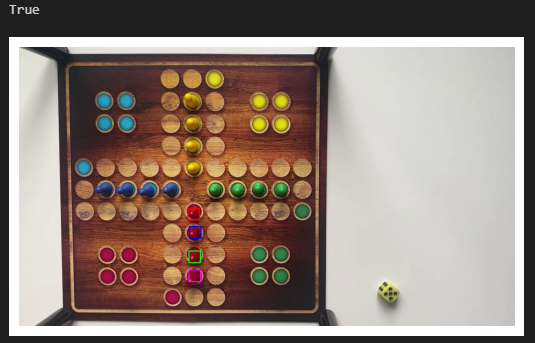

### Detect entering into play
This state is detected when a checker is placed on start field with corresponding color.

In [32]:
cap = cv2.VideoCapture('data/dataset_2/recordings/easy/play_2.mp4')

success, frame = cap.read()
if not success:
  print('Failed to read video')
  sys.exit(1)

In [33]:
bboxes = [(250, 180, 30, 28)]
colors = [(0, 0, 255)]
start_field = (155, 289, 35, 37)
multiTracker = cv2.legacy.MultiTracker.create()

for bbox in bboxes:
    multiTracker.add(cv2.legacy.TrackerCSRT_create(), frame, bbox)

In [34]:
while cap.isOpened():
    success, frame = cap.read()
    if not success:
        break

    success, boxes = multiTracker.update(frame)
    # dla ruszonego pionka

    for i, newbox in enumerate(boxes):
        p1 = (int(newbox[0]), int(newbox[1]))
        p2 = (int(newbox[0] + newbox[2]), int(newbox[1] + newbox[3]))
        cv2.rectangle(frame, p1, p2, colors[i], 2, 1)
        if check_intersection(newbox, start_field):
            cv2.putText(img=frame, text='new token entered', org=(850, 100), fontFace=cv2.FONT_HERSHEY_TRIPLEX, fontScale=1, color=(0, 0, 0), thickness=2)

    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.axis('off')
    plt.imshow(frame)
    plt.show()
    clear_output(wait=True)

    if cv2.waitKey(1) & 0xFF == 27:
        break

KeyboardInterrupt: 

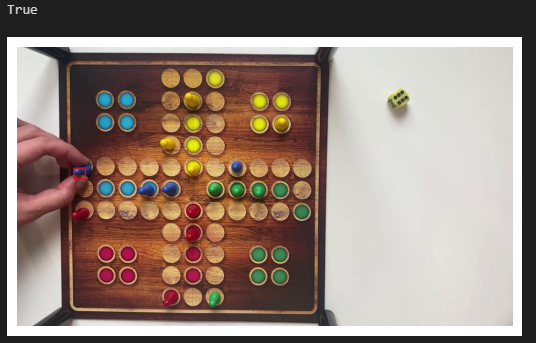

## Track state/score

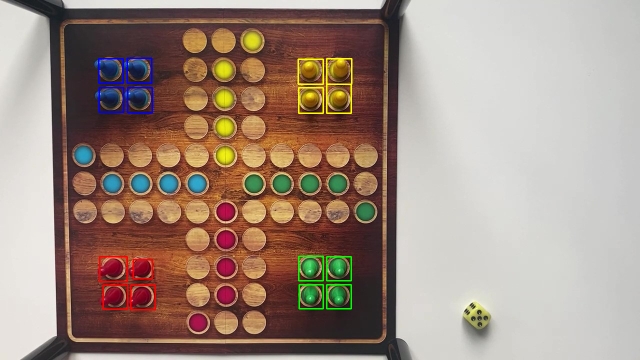

In [52]:
COLOR_VALUES = {'red': (0,0,255), 'green':(0,255,0), 'blue':(255,0,0), 'yellow':(0,255,255)}
img = cv2.imread('data/dataset_2/all_yard_easy.jpg', 1)
# img = cv2.imread('data/dataset_2/all_in_base_easy.jpg', 1)
_, _, board_coords = detect_board(img)
counters = detect_counters(img, board_img)


for c in counters:
    cv2.rectangle(img, (c.x, c.y), (c.x+c.w, c.y+c.h), COLOR_VALUES[c.color], 2)
imshow(cv2.resize(img, None, fx=0.5, fy=0.5))

In [53]:
yard_scores = get_score(counters, yards_objects_mapped)
base_scores = get_score(counters, bases_objects_mapped)

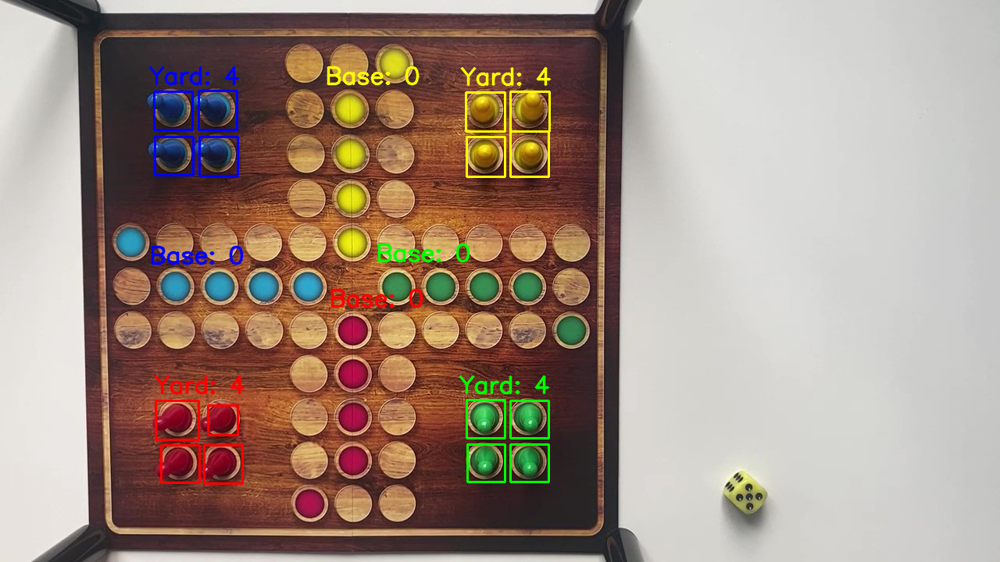

In [54]:
img_scored = draw_score(img, yard_scores, base_scores, yards_objects, bases_objects)
imshow(img_scored)

## Actions combined

In [55]:
def get_board_items(board_img):
    start_templates = ["start_blue", "start_green", "start_red", "start_yellow"]
    start_templates_files = [f'{TEMPLATES_PATH_DIR}/{t}.jpg' for t in start_templates]
    starts, start_coords = match_patterns(board_img, start_templates_files, color=COLORS[1])
    start_objects = create_game_objects(start_coords, board_img)
    # entering the start field

    yard_templates = ["yard_blue", "yard_green", "yard_red", "yard_yellow"]
    yard_templates_files = [f'{TEMPLATES_PATH_DIR}/{t}.jpg' for t in yard_templates]
    yards, yards_coords = match_patterns(board_img, yard_templates_files, color=COLORS[2])
    yards_objects = create_game_objects(yards_coords, board_img)

    base_templates = ["base_blue", "base_green", "base_red", "base_yellow"]
    base_templates_files = [f'{TEMPLATES_PATH_DIR}/{t}.jpg' for t in base_templates]
    bases, bases_coords = match_patterns(board_img, base_templates_files, color=COLORS[3])
    bases_objects = create_game_objects(bases_coords, board_img)

    return start_objects, yards_objects, bases_objects

In [56]:
def play_video_states(video_path, board_img, start_field):

    start_objects, yards_objects, bases_objects = get_board_items(board_img)
    yards_objects_mapped = map_coords(yards_objects, board_coords)
    bases_objects_mapped = map_coords(bases_objects, board_coords)

    cap = cv2.VideoCapture(video_path)
    success, frame = cap.read()
    if not success:
        print('Failed to read video')
        sys.exit(1)
    bboxes, counter_colors, tracker = get_bboxes(frame, board_img)
    # new_boxes = bboxes.copy()
    x = get_rolling_area(frame)

    while True:
        success, frame = cap.read()
        if not success:
            cap.release()
            break

        frame = get_dice_number(frame, x)
        success, boxes = tracker.update(frame)
        # new_boxes = boxes.copy()
        counter_objects = list()
        for i in range(len(boxes)):
            p1 = (int(boxes[i][0]), int(boxes[i][1]))
            p2 = (int(boxes[i][0] + boxes[i][2]), int(boxes[i][1] + boxes[i][3]))
            cv2.rectangle(frame, p1, p2, COLOR_VALUES[counter_colors[i]], 2, 1)

            x = int(boxes[i][0])
            y = int(boxes[i][1])
            h = int(boxes[i][2])
            w = int(boxes[i][3])
            if(frame[x:x+h, y:y+w].shape[0]==0 or frame[x:x+h, y:y+w].shape[1]==0):
                    continue
            color_i = determine_color(frame[x:x+h, y:y+w], 0)
            counter_objects.append(GameObject(x, y, w, h, color_i))
            for j in range(len(boxes)):
                x = int(boxes[j][0])
                h = int(boxes[j][2])
                y = int(boxes[j][1])
                w = int(boxes[j][3])
                # print(frame[x:x+h, y:y+w].shape)
                if(frame[x:x+h, y:y+w].shape[0]==0 or frame[x:x+h, y:y+w].shape[1]==0):
                    continue
                color_j = determine_color(frame[x:x+h, y:y+w], 0)
                if color_i != color_j:
                    if check_intersection(boxes[i], boxes[j]):
                        cv2.putText(img=frame, text='CAPTURED!', org=(850, 100), fontFace=cv2.FONT_HERSHEY_TRIPLEX, fontScale=2, color=(0, 0, 0), thickness=2)
                    if check_intersection(boxes[i], start_field):
                        cv2.putText(img=frame, text='New token entered', org=(850, 100), fontFace=cv2.FONT_HERSHEY_TRIPLEX, fontScale=1, color=(0, 0, 0), thickness=2)


        yard_scores = get_score(counter_objects, yards_objects_mapped)
        base_scores = get_score(counter_objects, bases_objects_mapped)
        frame = draw_score(frame, yard_scores, base_scores, yards_objects, bases_objects)
        cv2.imshow(video_path, frame)
        if cv2.waitKey(1) & 0xFF==ord('q'): # quit when 'q' is pressed
            cap.release()
            break
            
    cv2.destroyAllWindows()

## Final results

TODO
- improve counter detection
- start fields -> update

### Easy

In [57]:
play_video_states('data/dataset_2/recordings/easy/play_3.mp4', board_img, start_field=(155, 289, 35, 37))

### Medium

In [48]:
play_video_states('data/dataset_2/recordings/medium/play_1.mp4', board_img, start_field=(155, 289, 35, 37))

### Difficult

In [47]:
play_video_states('data/dataset_2/recordings/difficult/play_3.mp4', board_img, start_field=(155, 289, 35, 37))